In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image
%matplotlib inline

from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, roc_curve
import xgboost
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import StratifiedKFold
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

## Breast Cancer Wisconsin (Diagnostic) Data Set

Ссылка на соревнование: https://boosters.pro/champ_15

In [2]:
can_df = pd.read_csv('data_breast.csv')
can_df.head(5)


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [3]:
can_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
id                         569 non-null int64
diagnosis                  569 non-null object
radius_mean                569 non-null float64
texture_mean               569 non-null float64
perimeter_mean             569 non-null float64
area_mean                  569 non-null float64
smoothness_mean            569 non-null float64
compactness_mean           569 non-null float64
concavity_mean             569 non-null float64
concave points_mean        569 non-null float64
symmetry_mean              569 non-null float64
fractal_dimension_mean     569 non-null float64
radius_se                  569 non-null float64
texture_se                 569 non-null float64
perimeter_se               569 non-null float64
area_se                    569 non-null float64
smoothness_se              569 non-null float64
compactness_se             569 non-null float64
concavity_se               569 non

In [4]:
# посмотрим на статистики для категориальных значений 
can_df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [5]:
can_df['fractal_dimension_se'].describe()

count    569.000000
mean       0.003795
std        0.002646
min        0.000895
25%        0.002248
50%        0.003187
75%        0.004558
max        0.029840
Name: fractal_dimension_se, dtype: float64

Сгруппируем по одинаковым измерениям

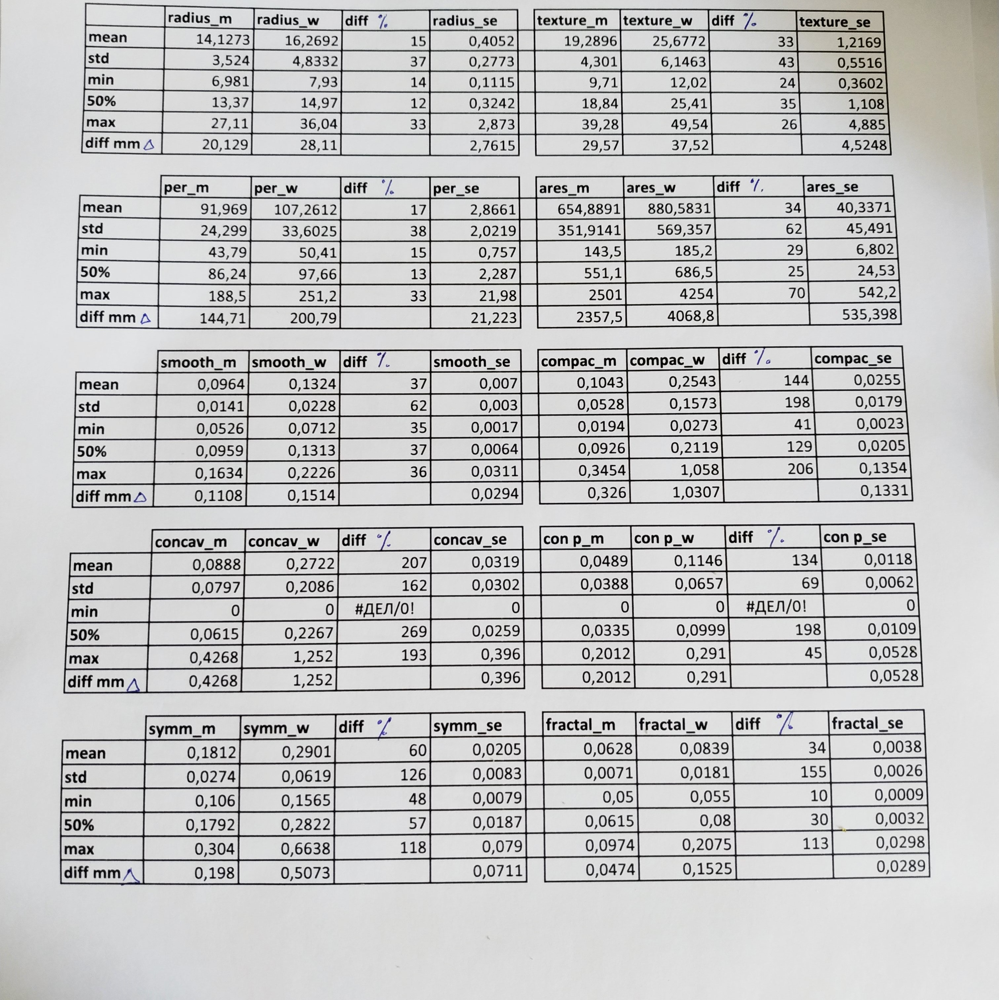

In [6]:
Image('pic1.jpg')

Показатель worst - это это наибольшие значения величин в каждом исследовании.
Часть переменных отличается по максимальному значению (radius, perimeter, area, compactness, symmetry, fractal)
При чем radius, perimeter, area, compactness - это связанная группа переменных по методу вычисления.
Часть - по медианному значению (texture, smoothness, concavity, concave points)

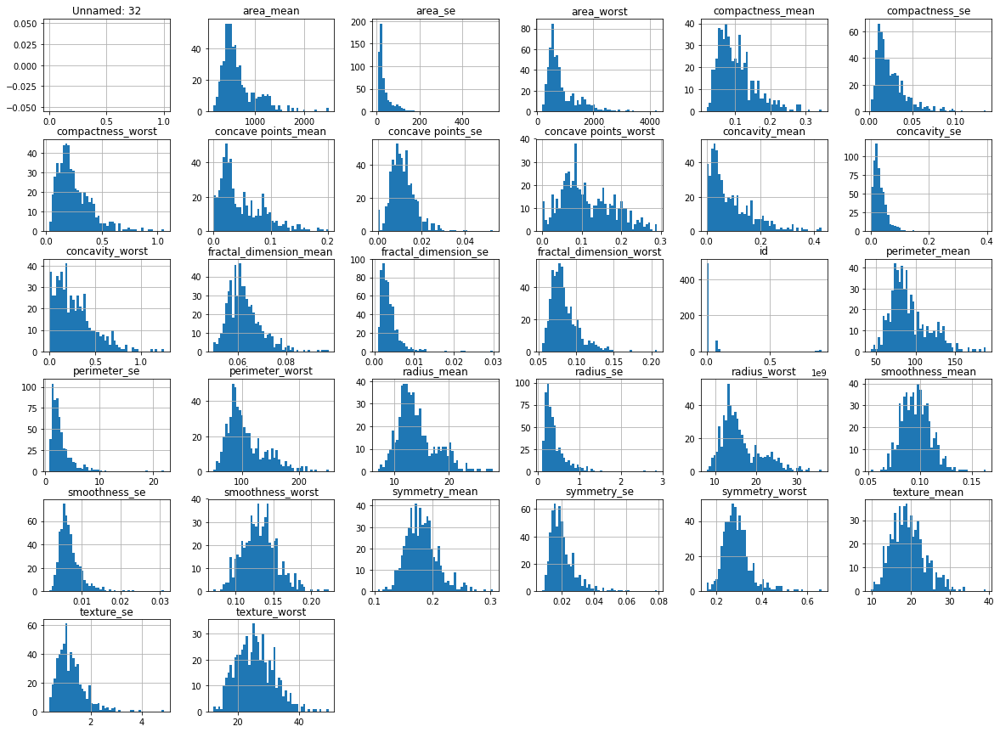

In [7]:
# распределения
histgrm = can_df.hist(bins=50, figsize=(20,15))

По значению mean и worst переменные распределены близко к нормальному и логнорамальному для стандартной ошибки выборки распределениям.
Все переменные имеют ассиметрию

In [8]:
can_df.skew().sort_values(ascending = False)

id                         6.473752
area_se                    5.447186
concavity_se               5.110463
fractal_dimension_se       3.923969
perimeter_se               3.443615
radius_se                  3.088612
smoothness_se              2.314450
symmetry_se                2.195133
compactness_se             1.902221
area_worst                 1.859373
fractal_dimension_worst    1.662579
texture_se                 1.646444
area_mean                  1.645732
compactness_worst          1.473555
concave points_se          1.444678
symmetry_worst             1.433928
concavity_mean             1.401180
fractal_dimension_mean     1.304489
compactness_mean           1.190123
concave points_mean        1.171180
concavity_worst            1.150237
perimeter_worst            1.128164
radius_worst               1.103115
perimeter_mean             0.990650
radius_mean                0.942380
symmetry_mean              0.725609
texture_mean               0.650450
texture_worst              0

In [9]:
# посмотрим на статистики для категориальных значений 
can_df.describe(include = 'object')

,diagnosis
count,569
unique,2
top,B
freq,357


In [10]:
print(round(357/569*100))

63


около 60% - это доброкачественное образование
около 40% - злокачественное
Последний класс является миноритарным, но его частоту в датасети можно считать достаточной

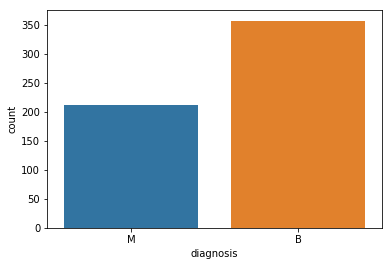

In [11]:
sns.countplot(x=can_df['diagnosis'], data=can_df)

In [12]:
def missingdata(can_df):
    '''
    считаем кол-во и долю пропущеных значений
    '''
    total = can_df.isnull().sum().sort_values(ascending = False)
    percent = (can_df.isnull().sum()/can_df.isnull().count()*100).sort_values(ascending = False)
    ms=pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    ms= ms[ms["Percent"] > 0]
    return ms

In [13]:
missingdata(can_df)

,Total,Percent
Unnamed: 32,569,100.0


В неназванной колонке отсутсвуют 100% значений.
Трудно установить природу данного признака, ничего не зная о нем.
Так что единственный вариант - удалить данный признак.

In [14]:
can_df.drop(can_df.iloc[:, [32]], axis=1, inplace = True)

In [15]:
def scales(data):
    '''
    заполняем булевыми значениям diagnosis
    '''
    if data == 'M':
        return 1
    else:
        return 0

In [16]:
can_df['diagnosis'] = can_df['diagnosis'].apply(scales)

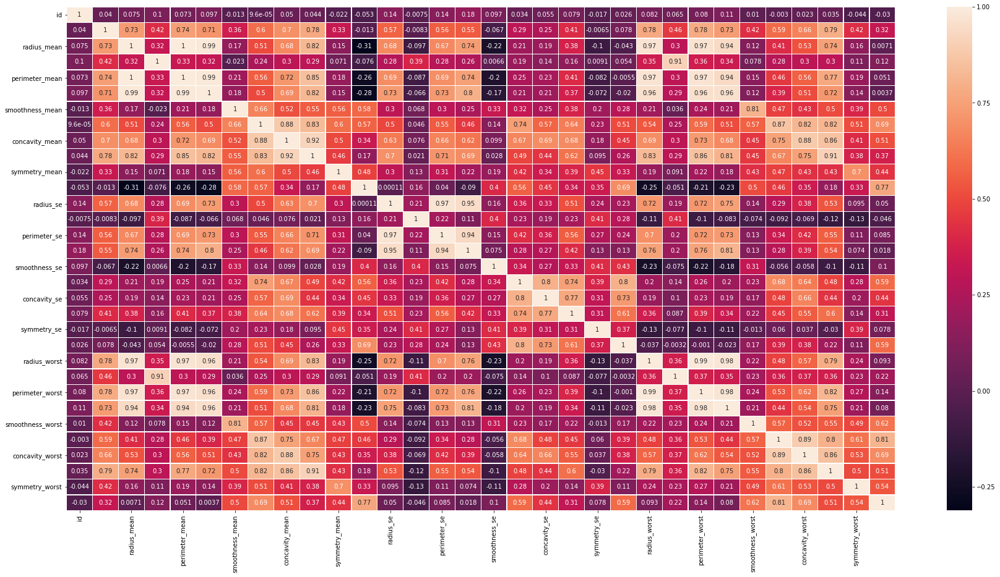

In [17]:
sns.heatmap(can_df.corr(),annot=True,linewidths=0.2)
fig=plt.gcf()
fig.set_size_inches(30,15)
plt.show()


Однонаправленные переменные:
1)area, perimeter, radius - показатели размера

2) concave points и показатели размера - чем больше размер тем больше вероятность неровных участков по контуру

3) concavity, concave points, compactness - 

compactness - чем большую площадь вмещает в себя одинаковый периметр тем значение меньше. Чем меньше значение тем больше компактность объекта.
Увеличение неровности участков по контуру объекта (concavity, concave points) увеличивает некомпактность объекта

СТРАТЕГИЯ: в модели изучить влияние однонаправленных переменных, если они не дают прибавления точности, то сокращать однонаправленные векторы

4) Корреляция между однородными mean и worst объяснима - чем больше среднее, тем больше в нем отдельное значение

5) Переменная smoоthness имеет среднюю корреляцию с  compactness - чем меньше вариативность длин радиуса тем лучше компактность, а также symmetry и fractal. Аналогично для symmetry и fractal

6) Fractal на худших значениях значимо коррелирует с compactness и concavity также худшими

7) Texture не имеет значимой корреляции с другими переменными, так как она не связана с размерами, а с плотностью объекта, измеряется по серой цветовой шкале


Посмотрим коэффициент корреляции для бинарной переменной diagnosis

In [18]:
import scipy as sc

In [19]:
all_corr_col = []

for i in set(can_df.columns):
    j = sc.stats.pointbiserialr(can_df['diagnosis'], can_df[i])
    all_corr_col.append(i)
    all_corr_col.append(j)
    
all_corr_col    

['area_mean',
 PointbiserialrResult(correlation=0.7089838365853899, pvalue=4.734564310308263e-88),
 'concavity_mean',
 PointbiserialrResult(correlation=0.6963597071719057, pvalue=9.966555755074321e-84),
 'perimeter_mean',
 PointbiserialrResult(correlation=0.742635529725833, pvalue=8.436251036174669e-101),
 'symmetry_worst',
 PointbiserialrResult(correlation=0.4162943110486191, pvalue=2.9511205771542106e-25),
 'concavity_worst',
 PointbiserialrResult(correlation=0.6596102103692332, pvalue=2.464663956782974e-72),
 'fractal_dimension_worst',
 PointbiserialrResult(correlation=0.32387218872082396, pvalue=2.3164324499829555e-15),
 'radius_mean',
 PointbiserialrResult(correlation=0.7300285113754564, pvalue=8.46594057226406e-96),
 'compactness_worst',
 PointbiserialrResult(correlation=0.590998237841792, pvalue=7.069816352539104e-55),
 'area_se',
 PointbiserialrResult(correlation=0.5482359402780244, pvalue=5.8955213926064624e-46),
 'concave points_mean',
 PointbiserialrResult(correlation=0.7766

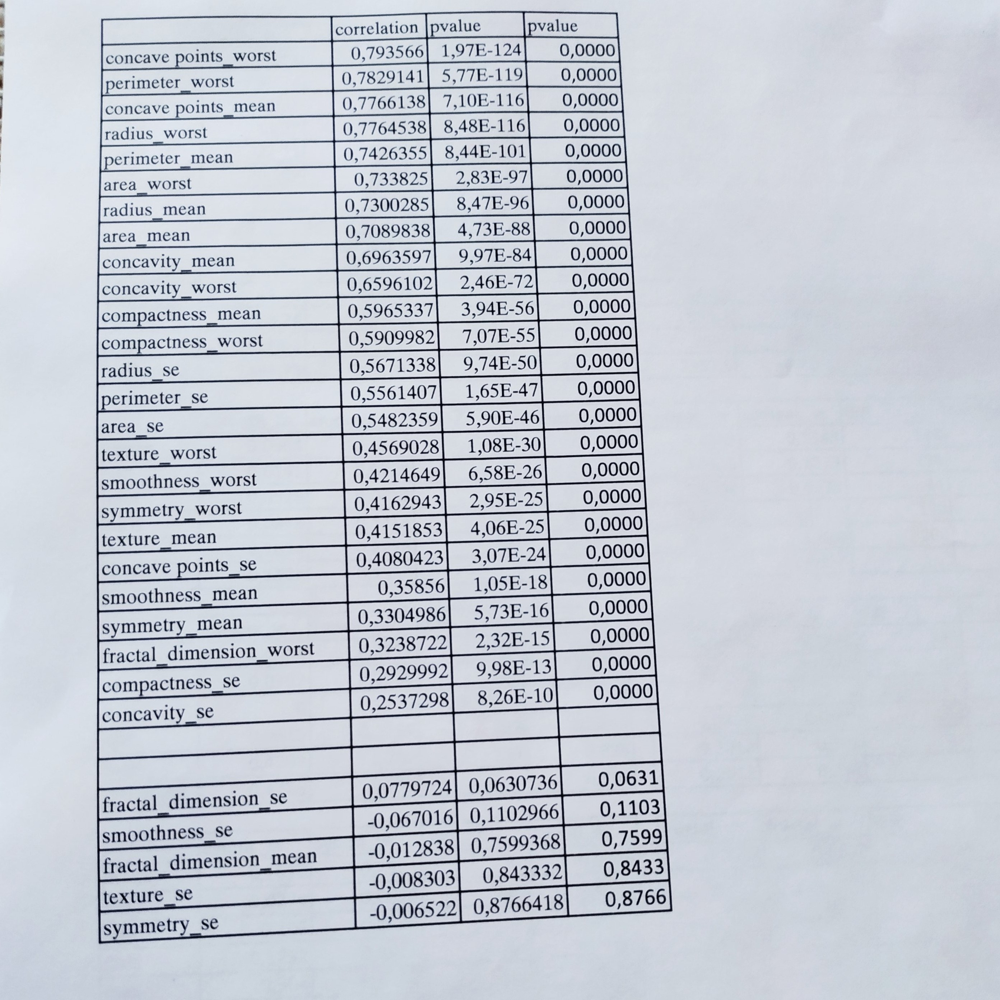

In [20]:
Image('pic2.jpg')

Наибольшую корреляцию diagnosis (>0.5) имеет
1) concave points_worst
2) perimeter_worst
3) concave points_mean
4) radius_worst
5) perimeter_mean
6) area_worst
7) radius_mean
8) area_mean
9) concavity_mean
10) concavity_worst
11) compactness_mean
12) compactness_worst

Для переменных размера есть очевидная логика - чем позже обратился пациент, тем больше размер опухоли

D:\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
D:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
D:\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
D:\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


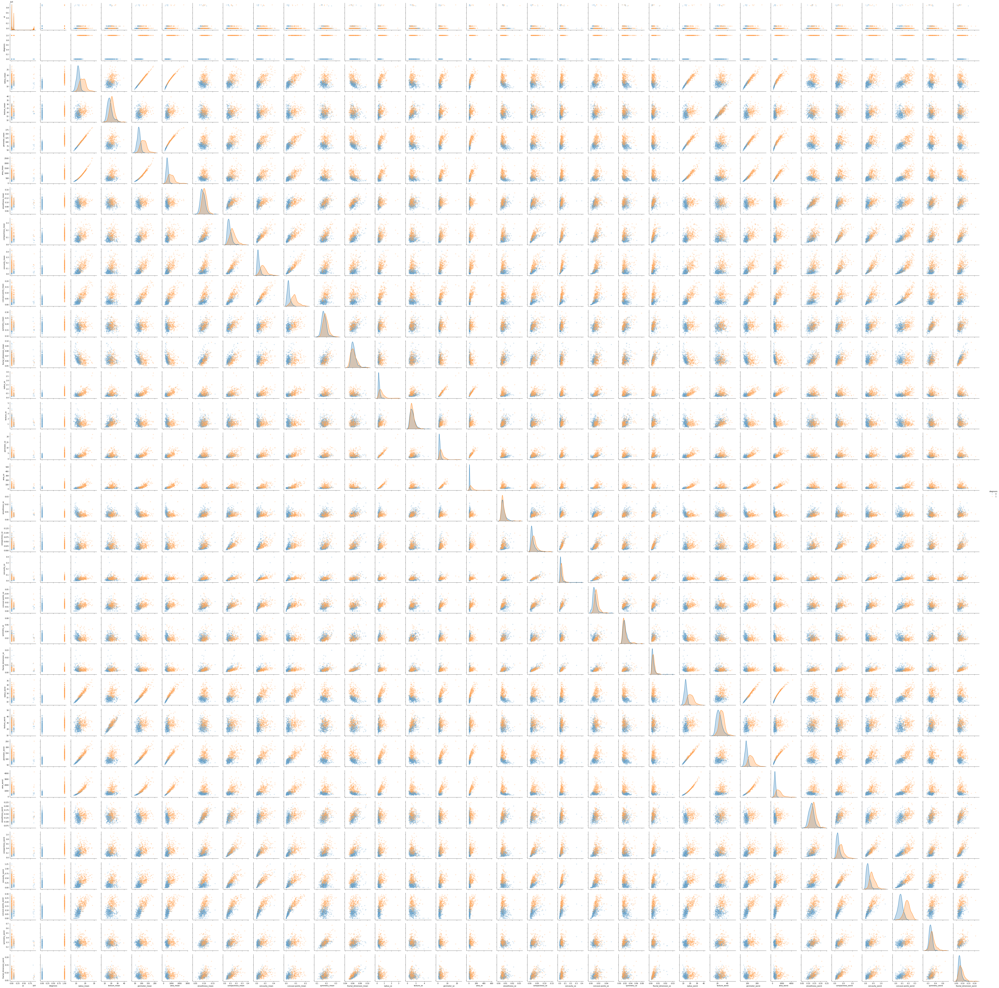

In [21]:
pair_plt = sns.pairplot(data=can_df ,plot_kws={'alpha':0.2},hue='diagnosis')

In [22]:
pair_plt.savefig("pair_plot_.png")

Выборки по diagnosis разделяют
1) radius_mean
2) perimeter_mean
3) area_mean
4) concavity_mean
5) concave points_mean
6) radius_worst
7) perimeter_worst
8) area_worst
9) concavity_worst
10) concave points_worst

Проверим разделяющие и коррелированные переменные по критерию Стьюдента

In [23]:
from scipy import stats

1) у пациентов с М и В средний радиус образования не отличается 

In [24]:
df_b = can_df[can_df['diagnosis'] == 0]
df_m =can_df[can_df['diagnosis'] == 1]

In [25]:
stats.ttest_ind(df_m['radius_mean'], df_b['radius_mean'])

Ttest_indResult(statistic=25.435821610057054, pvalue=8.465940572262422e-96)

Нет, статистически средний уровень radius_mean  отличается

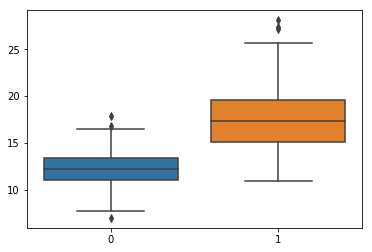

In [26]:
sns.boxplot(data=(df_b['radius_mean'], df_m['radius_mean'] ))

1.2) у пациентов с М и В radius_worst образования не отличается 

In [27]:
stats.ttest_ind(df_m['radius_worst'], df_b['radius_worst'])

Ttest_indResult(statistic=29.33908156342075, pvalue=8.482291921684414e-116)

Нет, статистически средний уровень radius_worst  отличается

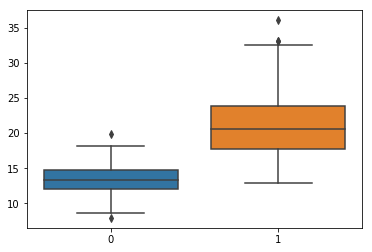

In [28]:
sns.boxplot(data=(df_b['radius_worst'], df_m['radius_worst'] ))

2) у пациентов с М и В средний периметр образования не отличается 

In [29]:
stats.ttest_ind(df_m['perimeter_mean'], df_b['perimeter_mean'])

Ttest_indResult(statistic=26.405212979192665, pvalue=8.43625103617473e-101)

Нет, статистически средний уровень perimeter_mean  отличается

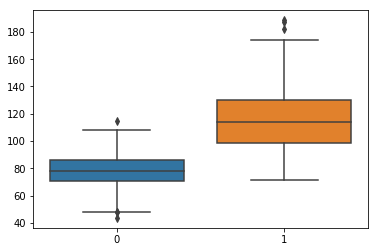

In [30]:
sns.boxplot(data=(df_b['perimeter_mean'], df_m['perimeter_mean'] ))

2.1) у пациентов с М и В perimeter_worst образования не отличается 

In [31]:
stats.ttest_ind(df_m['perimeter_worst'], df_b['perimeter_worst'])

Ttest_indResult(statistic=29.965717392710303, pvalue=5.771397139668621e-119)

Нет, статистически средний уровень perimeter_worst  отличается

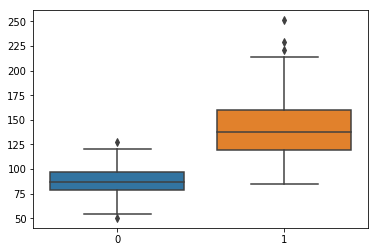

In [32]:
sns.boxplot(data=(df_b['perimeter_worst'], df_m['perimeter_worst'] ))

3) у пациентов с М и В средняя площадь образования не отличается 

In [33]:
stats.ttest_ind(df_m['area_mean'], df_b['area_mean'])

Ttest_indResult(statistic=23.938687235690992, pvalue=4.734564310307344e-88)

Нет, статистически средний уровень area_mean  отличается

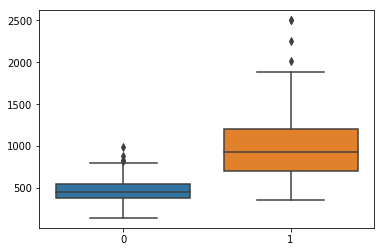

In [34]:
sns.boxplot(data=(df_b['area_mean'], df_m['area_mean'] ))

3.1) у пациентов с М и В area_worst образования не отличается 

In [35]:
stats.ttest_ind(df_m['area_worst'], df_b['area_worst'])

Ttest_indResult(statistic=25.721590260589004, pvalue=2.828847704286693e-97)

Нет, статистически средний уровень area_worst  отличается

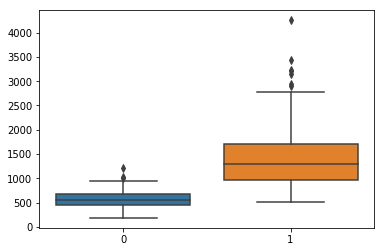

In [36]:
sns.boxplot(data=(df_b['area_worst'], df_m['area_worst'] ))

4) у пациентов с М и В средняя неровность (concavity) образования не отличается 

In [37]:
stats.ttest_ind(df_m['concavity_mean'], df_b['concavity_mean'])

Ttest_indResult(statistic=23.103963430622642, pvalue=9.966555755072963e-84)

Нет, статистически средний уровень concavity_mean  отличается

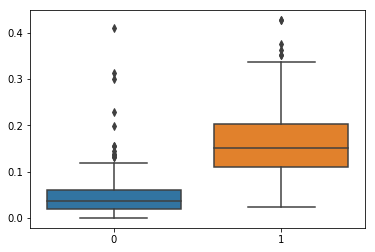

In [38]:
sns.boxplot(data=(df_b['concavity_mean'], df_m['concavity_mean'] ))

4.1) у пациентов с М и В concavity_worst образования не отличается 

In [39]:
stats.ttest_ind(df_m['concavity_worst'], df_b['concavity_worst'])

Ttest_indResult(statistic=20.897175392934134, pvalue=2.4646639567829224e-72)

Нет, статистически средний уровень concavity_worst  отличается

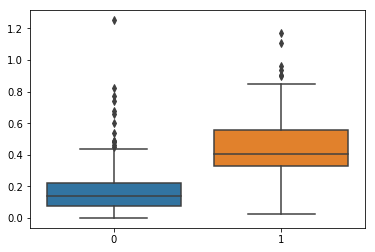

In [40]:
sns.boxplot(data=(df_b['concavity_worst'], df_m['concavity_worst'] ))

5) у пациентов с М и В среднее кол-во неровных участков (concave points) образования не отличается 

In [41]:
stats.ttest_ind(df_m['concave points_mean'], df_b['concave points_mean'])

Ttest_indResult(statistic=29.354318592113618, pvalue=7.101150161057422e-116)

Нет, статистически средний уровень concave points_mean  отличается

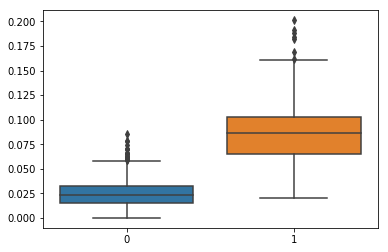

In [42]:
sns.boxplot(data=(df_b['concave points_mean'], df_m['concave points_mean'] ))

5.1) у пациентов с М и В среднее concave points_worst образования не отличается 

In [43]:
stats.ttest_ind(df_m['concave points_worst'], df_b['concave points_worst'])

Ttest_indResult(statistic=31.054555115984236, pvalue=1.9690997072164375e-124)

Нет, статистически средний уровень concave points_worst  отличается

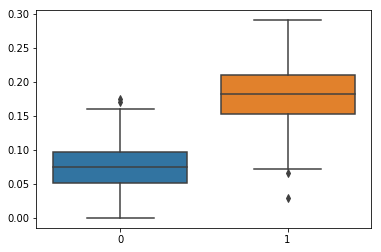

In [44]:
sns.boxplot(data=(df_b['concave points_worst'], df_m['concave points_worst'] ))

6) у пациентов с М и В среднее compactness_mean образования не отличается 

In [45]:
stats.ttest_ind(df_m['compactness_mean'], df_b['compactness_mean'])

Ttest_indResult(statistic=17.69839197688993, pvalue=3.9382631058873895e-56)

Нет, статистически средний уровень compactness_mean  отличается

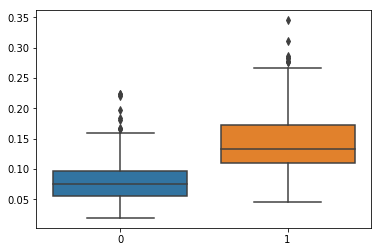

In [46]:
sns.boxplot(data=(df_b['compactness_mean'], df_m['compactness_mean'] ))

7) у пациентов с М и В среднее texture_mean образования не отличается 

In [47]:
stats.ttest_ind(df_m['texture_mean'], df_b['texture_mean'])

Ttest_indResult(statistic=10.86720108146434, pvalue=4.0586360478980736e-25)

Нет, статистически средний уровень texture_mean  отличается, но не так сильно как у переменных неровности и размера

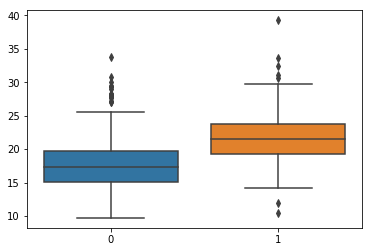

In [48]:
sns.boxplot(data=(df_b['texture_mean'], df_m['texture_mean'] ))

In [52]:
stats.ttest_ind(df_m['texture_worst'], df_b['texture_worst'])

Ttest_indResult(statistic=12.23098134599393, pvalue=1.0780574879494241e-30)

Нет, статистически средний уровень texture_worst  отличается, но не так сильно как у переменных неровности и размера, но лучше чем среднее

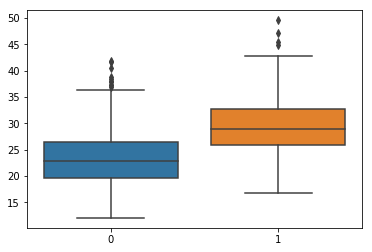

In [53]:
sns.boxplot(data=(df_b['texture_worst'], df_m['texture_worst'] ))

Коррелируют с diagnosis и разделяют выборку переменные неровности и размера, как по среднему так по наихудшим значениям.
На основе этого можно сгенирировать комплексную переменную по однородным показателям, объединяющую среднее и наихудшее.
В тестируемые модели возьмем все переменные (кроме id) для последующего отбора переменных 

In [54]:
can_df['radius_cx'] = can_df['radius_mean'] + can_df['radius_worst']
can_df['perimeter_cx'] = can_df['perimeter_mean'] + can_df['perimeter_worst']
can_df['area_cx'] = can_df['area_mean'] + can_df['area_worst']
can_df['concavity_cx'] = can_df['concavity_mean'] + can_df['concavity_worst']
can_df['concave_points_cx'] = can_df['concave points_mean'] + can_df['concave points_worst']
can_df['compactness_cx'] = can_df['compactness_mean'] + can_df['compactness_worst']

In [55]:
all_corr_col_1 = []

for i in set(can_df.columns):
    j = sc.stats.pointbiserialr(can_df['diagnosis'], can_df[i])
    all_corr_col_1.append(i)
    all_corr_col_1.append(j)
    
#all_corr_col_1   

дата сет состоит из 569 строк
соотношение классов 63/37, нельзя сказать о недостатке примеров миноритарного класса
Если выбирать между стратегии Oversampling/Undersampling то, из-за небольшого размера датасета предпочтительно не уменьшать примеры мажоритарного класса, а увеличить миноритарный класс.
Так как в данной ситуации лучше получить ложно-положительный результат (1), чем ложно отрицательный


Для датасета применим RAndomForestClassifier и LogisticRegression

Выполним кросс-валидацию дна выбранных моделях

In [56]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [57]:
X = can_df.drop(['diagnosis', 'id'], axis=1)
Y = can_df['diagnosis']

In [58]:

kf = KFold(n_splits=10)
results_RF = cross_val_score(RandomForestClassifier(n_estimators=26, max_depth=13, random_state=0), X, Y, cv=kf)

In [59]:
results_RF

array([0.89473684, 0.9122807 , 0.9122807 , 0.96491228, 0.98245614,
       0.98245614, 0.96491228, 0.96491228, 0.96491228, 1.        ])

In [60]:
results_LR = cross_val_score(LogisticRegression(solver = 'liblinear', multi_class='ovr'), X, Y, cv=kf)

In [61]:
results_LR

array([0.87719298, 0.94736842, 0.94736842, 0.96491228, 0.96491228,
       0.94736842, 0.98245614, 0.96491228, 0.94736842, 0.96428571])

Лучшие результаты получены по score дает RF

Обучим модели на тренировочных данных и проверим на тесте
Разобъем выборку на 70/30

In [64]:
train_70, test_30 = train_test_split(can_df, test_size=0.3, shuffle=True)

In [65]:
train_70.groupby(['diagnosis']).count()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,radius_cx,perimeter_cx,area_cx,concavity_cx,concave_points_cx,compactness_cx
diagnosis,,,,,,,,,,,,,,,,,,,,,
0,251,251,251,251,251,251,251,251,251,251,...,251,251,251,251,251,251,251,251,251,251
1,147,147,147,147,147,147,147,147,147,147,...,147,147,147,147,147,147,147,147,147,147


готовим данные для обучения и тестирования модели

In [66]:
X_test = test_30.drop(['diagnosis'], axis=1)
y_test = test_30['diagnosis']

In [67]:
X_train = train_70.drop(['diagnosis'], axis=1)
y_train = train_70['diagnosis']

In [68]:
X_test.drop('id', axis=1, inplace = True)
X_train.drop('id', axis=1, inplace = True)

Используем для обучения модель RandomForestClassifier

In [69]:
cols = list(filter(lambda x: x in X_test.columns, X_train.columns))

In [70]:
len(cols)

36

In [89]:
# обучаем модель
clf = RandomForestClassifier(n_estimators=19, max_depth=13, random_state=0)\
.fit(X_train[cols], y_train)

In [90]:
y_train_predict = clf.predict_proba(X_train[cols])[:, 1]

roc_auc_train = np.round(roc_auc_score(y_train, y_train_predict), 4)
print("Train: ", roc_auc_train)

Train:  1.0


In [91]:
y_test_predict = clf.predict_proba(X_test[cols])[:, 1]

roc_auc_test = np.round(roc_auc_score(y_test, y_test_predict), 4)
print("Test: ", roc_auc_test)

Test:  0.9844


In [92]:
# вероятности принадлежности к классу 1, отсечение по p > 0.5
y_test_predict

array([0.05263158, 0.10526316, 1.        , 0.89473684, 0.05263158,
       1.        , 0.89473684, 1.        , 0.        , 1.        ,
       0.        , 0.        , 0.        , 0.89473684, 0.05263158,
       0.        , 1.        , 1.        , 0.89473684, 0.        ,
       0.        , 1.        , 1.        , 0.        , 0.42105263,
       1.        , 0.78947368, 0.05263158, 0.        , 0.        ,
       1.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.31578947, 0.68421053, 0.        , 0.        ,
       0.        , 0.        , 1.        , 0.42105263, 0.94736842,
       0.        , 0.        , 0.21052632, 0.47368421, 0.        ,
       0.89473684, 0.47368421, 0.        , 0.        , 1.        ,
       0.        , 0.57894737, 0.26315789, 0.        , 0.        ,
       0.        , 0.        , 0.15789474, 0.        , 0.        ,
       0.21052632, 0.        , 0.10526316, 0.        , 0.        ,
       0.05263158, 0.        , 0.10526316, 0.94736842, 0.15789

In [93]:
y_test_predict_1 = clf.predict(X_test)

In [94]:
y_test_predict_1

array([0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1,
       1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0,
       1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1,
       0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], dtype=int64)

Для Random Forest есть метод feature_importances_ для оценки переменных

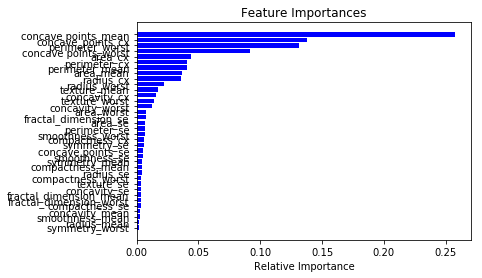

In [121]:

features = X_train.columns
importances = clf.feature_importances_

indices = np.argsort(importances)

plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

Логистическая регрессия

In [96]:
clf_LR = LogisticRegression(solver = 'liblinear', multi_class='ovr').fit(X_train[cols], y_train)

In [97]:
y_train_predict_LR = clf_LR.predict_proba(X_train[cols])[:, 1]

roc_auc_train_LR = np.round(roc_auc_score(y_train, y_train_predict_LR), 4)
print("Train: ", roc_auc_train_LR)

Train:  0.9953


In [98]:
y_test_predict_LR = clf_LR.predict_proba(X_test[cols])[:, 1]

roc_auc_test_LR = np.round(roc_auc_score(y_test, y_test_predict_LR), 4)
print("Test: ", roc_auc_test_LR)

Test:  0.9824


In [99]:
# вероятности к классу 1, отсечение по p > 0.5
y_test_predict_LR

array([2.87335020e-03, 1.16512160e-01, 9.99999923e-01, 9.99821641e-01,
       1.32024911e-03, 9.99998509e-01, 8.78328452e-01, 9.99943048e-01,
       1.68984619e-03, 1.00000000e+00, 1.35872484e-02, 1.66839867e-04,
       2.37423911e-03, 9.99963684e-01, 1.53412954e-02, 3.30051160e-02,
       9.99999926e-01, 9.99999985e-01, 9.99349467e-01, 2.53420770e-03,
       4.43190159e-04, 1.00000000e+00, 9.99295083e-01, 2.15694025e-03,
       7.18384159e-03, 9.99999650e-01, 9.71961629e-01, 2.64858672e-03,
       6.18193080e-04, 4.02084645e-03, 1.00000000e+00, 7.97914764e-03,
       1.95821098e-02, 6.05518362e-04, 2.28855711e-03, 5.04805911e-02,
       1.96113059e-03, 4.33616705e-01, 1.29046392e-02, 8.70863074e-04,
       3.37816923e-04, 1.35193240e-04, 1.00000000e+00, 2.14004120e-02,
       7.05496911e-01, 4.53732973e-03, 3.10804903e-04, 1.01852801e-03,
       8.45922880e-01, 2.99233558e-03, 9.99977944e-01, 1.49010035e-03,
       5.43751876e-04, 4.50362357e-03, 1.00000000e+00, 2.03783873e-03,
      

In [100]:
from sklearn.feature_selection import RFE

Выбираем 13 лучших переменных в логистической регрессии

In [103]:
rfe = RFE(clf_LR, 13)
fit = rfe.fit(X_train, y_train)
features_bool = np.array(fit.support_)

features_LR = np.array(X_train.columns)

result = features_LR[features_bool]
print(result)
print(features_bool)

['radius_mean' 'texture_mean' 'concavity_mean' 'radius_se' 'texture_se'
 'perimeter_se' 'radius_worst' 'texture_worst' 'concavity_worst'
 'concave points_worst' 'radius_cx' 'concavity_cx' 'concave_points_cx']
[ True  True False False False False  True False False False  True  True
  True False False False False False False False  True  True False False
 False False  True  True False False  True False False  True  True False]


Оценка моделей

по ROC/AUC - расчитано при обучении и тестировании моделей
RF (test) = 0.9953
LR (test) = 0.9922

Кол-во ошибок 1 и 2 рода

In [104]:
from sklearn.metrics import confusion_matrix

In [105]:
confusion_matrix_ = confusion_matrix(y_test, y_test_predict.round())
print('RF', confusion_matrix_)

RF [[104   2]
 [  6  59]]


In [106]:
confusion_matrix_LR = confusion_matrix(y_test, y_test_predict_LR.round())
print('LR', confusion_matrix_LR)

LR [[105   1]
 [  6  59]]


RF: 2 ошибки 1-го рода и 6 ошибок 2-го рода (не диагностировали рак, но он был)
LR: 1 ошибка 1-го рода и 6 ошибки 2-го рода
По ошибкам 2-го рода одинаковый показатель 3,5% - для диагноза рак это достаточно большой процент

In [107]:
test_30.groupby(['diagnosis']).count()['id']

diagnosis
0    106
1     65
Name: id, dtype: int64

In [115]:
from sklearn.metrics import classification_report

In [116]:
print('RF', classification_report(y_test, y_test_predict.round()))

RF               precision    recall  f1-score   support

           0       0.95      0.98      0.96       106
           1       0.97      0.91      0.94        65

   micro avg       0.95      0.95      0.95       171
   macro avg       0.96      0.94      0.95       171
weighted avg       0.95      0.95      0.95       171



In [117]:
print('LR', classification_report(y_test, y_test_predict_LR.round()))

LR               precision    recall  f1-score   support

           0       0.95      0.99      0.97       106
           1       0.98      0.91      0.94        65

   micro avg       0.96      0.96      0.96       171
   macro avg       0.96      0.95      0.96       171
weighted avg       0.96      0.96      0.96       171



По метрикам  F1-Score, Precision, Recall для диагноза 1 (рак) модели показывают одинаковую эффективность

In [108]:
skf = StratifiedKFold(n_splits=10)

from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

In [109]:
sfs_forward_RF = SFS(clf, 
           k_features=32, 
           forward=True, 
           floating=True, 
           verbose=1,
           scoring='roc_auc',
           cv=skf,
           n_jobs=-1)

sfs_forward_RF = sfs_forward_RF.fit(X_train.values, y_train.values,custom_feature_names=X_train.columns)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  36 out of  36 | elapsed:   30.4s finished
Features: 1/32[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:    3.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.2s finished
Features: 2/32[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 out of  34 | elapsed:    3.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    0.2s finished
Features: 3/32[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 out of  33 | elapsed:    4.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


[Parallel(n_jobs=-1)]: Done  17 out of  17 | elapsed:    2.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  19 out of  19 | elapsed:    2.5s finished
Features: 20/32[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  16 out of  16 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:    2.5s finished
Features: 21/32[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  22 out of  22 | elapsed:    2.9s finished
Features: 22/32[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  14 out of  14 | elapsed:    1.9s finished
[P

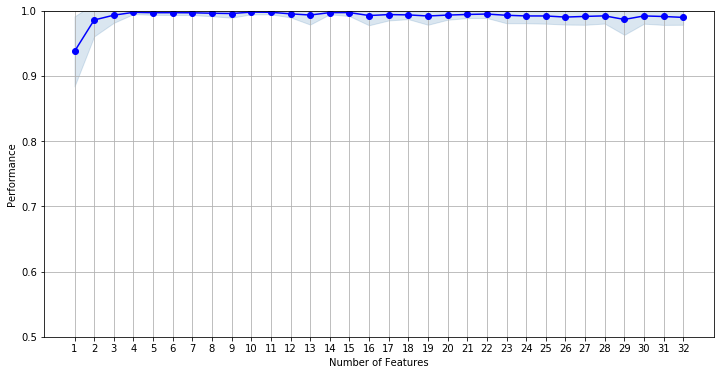

In [110]:
fig1 = plot_sfs(sfs_forward_RF.get_metric_dict(), kind='std_dev')

plt.ylim([0.5, 1])
plt.grid()
fig1.set_size_inches(12, 6)
plt.show()

самые полезные
'concave_points_cx
'area_worst'
'texture_worst'
'compactness_mean'
   

In [111]:
sfs_forward_RF.get_metric_dict()

{1: {'feature_idx': (34,),
  'cv_scores': array([0.94487179, 0.976     , 0.96      , 0.95466667, 0.876     ,
         0.95466667, 0.91733333, 0.98571429, 0.99571429, 0.81      ]),
  'avg_score': 0.9374967032967033,
  'feature_names': ('concave_points_cx',),
  'ci_bound': 0.03985189448034992,
  'std_dev': 0.053657196155265034,
  'std_err': 0.01788573205175501},
 2: {'feature_idx': (23, 34),
  'cv_scores': array([0.96666667, 0.992     , 0.992     , 1.        , 1.        ,
         0.996     , 1.        , 0.99714286, 0.99714286, 0.91571429]),
  'avg_score': 0.9856666666666666,
  'feature_names': ('area_worst', 'concave_points_cx'),
  'ci_bound': 0.018673101701349993,
  'std_dev': 0.025141747811025326,
  'std_err': 0.00838058260367511},
 3: {'feature_idx': (21, 23, 34),
  'cv_scores': array([0.9974359 , 0.99466667, 0.99466667, 0.996     , 0.99333333,
         1.        , 1.        , 0.99714286, 0.99857143, 0.95857143]),
  'avg_score': 0.9930388278388278,
  'feature_names': ('texture_worst'

In [112]:
sfs_forward_LR = SFS(clf_LR, 
           k_features=32, 
           forward=True, 
           floating=True, 
           verbose=1,
           scoring='roc_auc',
           cv=skf,
           n_jobs=-1)

sfs_forward_LR = sfs_forward_LR.fit(X_train.values, y_train.values,custom_feature_names=X_train.columns)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  36 out of  36 | elapsed:    8.4s finished
Features: 1/32[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  28 out of  35 | elapsed:    0.8s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:    1.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.0s finished
Features: 2/32[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 out of  34 | elapsed:    0.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    0.0s finished
Features: 3/32[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 out of  33 | elapsed:    0.6s rema

[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:    0.4s finished
Features: 21/32[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   8 out of  15 | elapsed:    0.1s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  22 out of  22 | elapsed:    0.4s finished
Features: 22/32[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   7 out of  14 | elapsed:    0.1s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done  14 out of  14 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  22 out of  22 | elapsed:    0.4s finished
Features: 23/32[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  13 | elapsed:    0

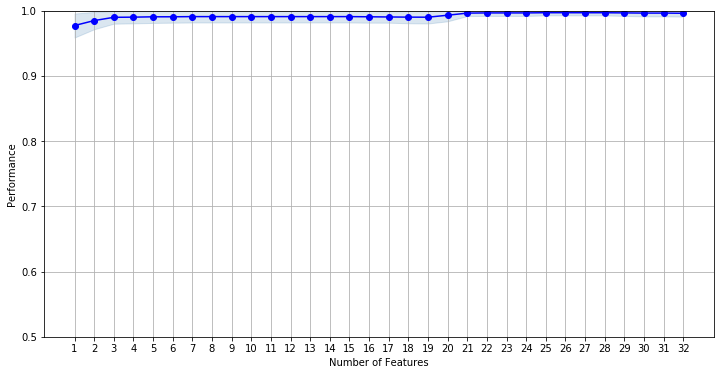

In [113]:
fig2 = plot_sfs(sfs_forward_LR.get_metric_dict(), kind='std_dev')

plt.ylim([0.5, 1])
plt.grid()
fig2.set_size_inches(12, 6)
plt.show()

Три лучшие переменные
concave_points_cx
concavity_cx
perimeter_worst 

In [114]:
sfs_forward_LR.get_metric_dict()

{1: {'feature_idx': (34,),
  'cv_scores': array([0.98717949, 1.        , 0.984     , 0.968     , 0.97333333,
         0.97866667, 0.952     , 0.99142857, 0.99714286, 0.94      ]),
  'avg_score': 0.9771750915750914,
  'feature_names': ('concave_points_cx',),
  'ci_bound': 0.013667645753799498,
  'std_dev': 0.018402325880740807,
  'std_err': 0.006134108626913602},
 2: {'feature_idx': (22, 34),
  'cv_scores': array([0.98717949, 0.96266667, 0.976     , 0.99466667, 0.98133333,
         1.        , 1.        , 1.        , 0.98      , 0.96571429]),
  'avg_score': 0.9847560439560441,
  'feature_names': ('perimeter_worst', 'concave_points_cx'),
  'ci_bound': 0.00986092480517306,
  'std_dev': 0.013276898964097722,
  'std_err': 0.004425632988032574},
 3: {'feature_idx': (22, 33, 34),
  'cv_scores': array([0.97692308, 0.976     , 1.        , 0.98666667, 0.98666667,
         1.        , 1.        , 0.99714286, 0.99714286, 0.97714286]),
  'avg_score': 0.989768498168498,
  'feature_names': ('perimete

In [118]:
from sklearn.metrics import brier_score_loss

При помощи BS оценивается разность между прогностической вероятностью события P и его частотой. Равна от 0 или 1. Чем меньше значение BS — тем лучше
оценка прогноза.

In [119]:
brier_score_loss(y_test, y_test_predict)

0.0352173138293564

In [120]:
brier_score_loss(y_test, y_test_predict_LR)

0.030347760389788665

Немного лучше LR (0.030<0.035) по данному показателю

На основании отработки SequentialFeatureSelector для двух моделей получили, что сгенерированная переменная concave_points_cx (mean + worst) дает хорошие результаты для модели.
Далее важными определении характера опухоли является размер (area и периметр худшие значения), а также их объединяющая переменная compactness - раковые клетки имеют, как правило, более быстрый рост. Поэтому необходимо оставить в данных переменные размерности, хоть они и скореелированны между собой. В размерных велечинах (периметр, площади и радиус) важны худшие значения - опять же из-за фактора более активного роста раковых клеток.
Texture тоже попала в список, хотя в перевоначальном варианте демонстрировала более худшие показатели по корреляциям и Пирсону. Сама переменная характеризует наличие воспалительного процесса, при чем тоже работает на худших показателях.

